In [3]:
import pandas as pd
# import glob

# # Specify the folder path
# folder_path = 'C:/DAp/ass/01/00/'

# # Get all text file paths in the folder
# file_paths = glob.glob(folder_path + '*.txt')

# # Initialize an empty string to store the combined content
# combined_content = ''
# # Iterate over the file paths
# for file_path in file_paths:
#     # Read the content of each file
#     with open(file_path, 'r') as file:
#         content = file.read()
#     # Append the content to the combined content
#     combined_content += content

# # Specify the output file path
# output_file_path = 'C:/DAp/ass/combined.txt'

# # Write the combined content to the output file
# with open(output_file_path, 'w') as file:
#     file.write(combined_content)

# Lấy dữ liệu

Dữ liệu được chia làm 24 folder chứa dữ liệu của 1 tiếng, mỗi folder chứa 60 tập con thể hiện dữ liệu của 60 phút.
Ở dưới đây là dữ liệu của 00:00

In [25]:
df= pd.read_csv('1804010059.txt',sep='|',header=None)

# Encodeing

In [26]:
name = ['vehicle ID',
        'Control Character',
        'Business Status',
        'Passenger Status',
        'Top Light Status',
        'Service Status',
        'Service Status1',
        'Meaningless Field',
        'Reception Date',
        'GPS Time',
        'Longitude',
        'Latitude',
        'Speed',
        'Direction',
        'Number of Satellites',
        'Meaningless Field']

df.rename(columns=dict(zip(df.columns, name)), inplace=True)


Dữ liệu phân thành 3 nhóm features chính là trạng thái xe, địa điểm xe, thông tin đón nhận khách

In [27]:
df.describe()

,vehicle ID,Business Status,Passenger Status,Service Status,Service Status1,Meaningless Field,Longitude,Latitude,Speed,Direction,Number of Satellites
count,59180.000000,59180.000000,59180.000000,59179.000000,59179.000000,59180.000000,59180.000000,59180.000000,59180.000000,59180.000000,59180.000000
mean,19556.166729,0.000828,0.540605,0.039575,0.025719,0.012775,121.457476,31.232951,11.971345,180.123775,9.413011
std,5957.157704,0.028763,0.510778,0.194960,0.158296,0.151391,0.115529,0.117632,21.182833,109.883161,2.010387
min,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,120.233813,30.718292,0.000000,0.000000,0.000000
25%,14685.000000,0.000000,0.000000,0.000000,0.000000,0.000000,121.401312,31.168760,0.000000,80.000000,8.000000
50%,18913.500000,0.000000,1.000000,0.000000,0.000000,0.000000,121.446551,31.246840,0.000000,173.000000,10.000000
75%,25590.000000,0.000000,1.000000,0.000000,0.000000,0.000000,121.501712,31.317910,18.100000,270.000000,11.000000
max,31005.000000,1.000000,3.000000,1.000000,1.000000,2.000000,121.901878,32.541532,117.100000,359.000000,13.000000


In [28]:
df['Top Light Status'].unique()

array(['1', '5', '0', '3', '2', 'V', '4'], dtype=object)

In [29]:
Top_Light_Status = {'0': 'Operating', '1': 'Waiting', '2': 'Dispatch', '3': 'Suspended', '4': 'Seeking Help', '5': 'Shutdown','V': 'No Signal','A': 'Alarm'}
Control_character = {'A': 'Normal', 'M': 'Alarm'}
Business_status = {0: 'Normal', 1: 'Alarm'}
Passenger_status = {0: 'Loaded', 1: 'Empty'}
Service_status = {0: 'Ground road', 1: 'Express way'}
Service_status1 = {0: 'No break', 1: 'Break'}

In [30]:
df.replace({'Top Light Status': Top_Light_Status,
            'Control Character': Control_character,
            'Business Status': Business_status,
            'Passenger Status': Passenger_status,
            'Service Status': Service_status,
            'Service Status1': Service_status1}, inplace=True)

In [31]:
df.tail()

,vehicle ID,Control Character,Business Status,Passenger Status,Top Light Status,Service Status,Service Status1,Meaningless Field,Reception Date,GPS Time,Longitude,Latitude,Speed,Direction,Number of Satellites,Meaningless Field
59175,21505,Normal,Normal,Empty,Suspended,Ground road,No break,0,2018-04-01 00:59:59,2018-04-01 01:00:02,121.418873,31.181398,0.0,334.0,7,000
59176,30004,Normal,Normal,Empty,Shutdown,Ground road,No break,0,2018-04-01 00:59:59,2018-04-01 01:00:02,121.350475,31.178253,0.0,157.0,10,000
59177,27082,Normal,Normal,Loaded,Operating,Ground road,No break,0,2018-04-01 00:59:59,2018-04-01 01:00:01,121.528597,31.328088,0.0,313.0,11,000
59178,24026,Normal,Normal,Empty,Shutdown,Ground road,No break,0,2018-04-01 00:59:59,2018-04-01 01:00:02,121.486587,31.382345,0.0,74.0,8,000
59179,15753,Normal,Normal,Empty,Waiting,Ground road,No break,0,2018-04-01 00:59:59,2018-04-01 01:00:01,121.410455,31.271040,15.0,250.0,10,013


Có một số dữ liệu bị lỗi thông số, có decode nhưng mã decode không có trong file hướng dẫn (rất may là những hàng như này rất ít)

In [32]:
df.drop(df[df['Passenger Status']==2].index,inplace=True)
df.drop(df[df['Passenger Status']==3].index,inplace=True)
df.drop(df[df['Service Status']==7].index,inplace=True)

# Phân tích dữ liệu

## 1. Trạng thái

Chủ yếu dữ liệu tập trung ở vùng xung quanh sân bay, gần biển 

Dưới đây là 10 center các xe hay lui tới

In [33]:
df.sort_values(by=['vehicle ID','Reception Date'],inplace=True)
df['Pick up spot'] = 0
df.loc[(df['Passenger Status'] == 'Loaded') & (df['Passenger Status'].shift() == 'Empty')&(df['vehicle ID']!=df['vehicle ID'].shift()), 'Pick up spot'] = 1

In [34]:
print('number of pick up spots: ', df['Pick up spot'].sum())

number of pick up spots:  2625


Sử dụng DBscan để phân cụm

In [35]:
colors = ['red', 'blue', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown', 'gray', 'black', 'white', 'cyan', 'magenta', 'lime', 'teal', 'olive', 'navy', 'maroon', 'aqua', 'silver', 'gold', 'indigo', 'violet', 'coral', 'turquoise', 'salmon', 'khaki', 'plum', 'orchid', 'peru', 'sienna', 'lavender', 'crimson', 'chartreuse', 'thistle', 'tomato', 'chocolate', 'slategray', 'darkgreen', 'darkblue', 'darkred', 'darkorange', 'darkviolet', 'darkcyan', 'darkmagenta', 'darkolivegreen', 'darkgoldenrod', 'darkslategray', 'darkkhaki', 'darkseagreen', 'darkslateblue', 'darkorchid', 'darkturquoise', 'darkgray', 'lightgray', 'lightblue', 'lightgreen', 'lightyellow', 'lightorange', 'lightpink', 'lightbrown', 'lightcyan', 'lightmagenta', 'lightolive', 'lightpurple', 'lightcoral', 'lightturquoise', 'lightsalmon', 'lightkhaki', 'lightplum', 'lightorchid', 'lightperu', 'lightsienna', 'lightlavender', 'lightcrimson', 'lightchartreuse', 'lightthistle', 'lighttomato', 'lightchocolate', 'lightslategray', 'mediumblue', 'mediumvioletred', 'mediumseagreen', 'mediumorchid', 'mediumturquoise', 'mediumslateblue', 'mediumspringgreen', 'mediumaquamarine', 'mediumpurple', 'mediumslategray', 'mediumpink', 'mediumbrown', 'mediumcyan', 'mediumpurple', 'mediumcoral', 'mediumturquoise', 'mediumsalmon', 'mediumkhaki', 'mediumplum', 'mediumorchid', 'mediumperu', 'mediumsienna', 'mediumlavender', 'mediumcrimson', 'mediumchartreuse', 'mediumthistle', 'mediumtomato', 'mediumchocolate']

In [36]:
pick_up_spots = df.loc[(df['Pick up spot'] == 1)]
X = pick_up_spots[['Latitude', 'Longitude']]

In [37]:
# Data processing 
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Dataset
from sklearn import datasets

# Dimensionality reduction
from sklearn.decomposition import PCA

# Modeling
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as hier
from sklearn.mixture import GaussianMixture

# Number of clusters
from sklearn.metrics import silhouette_score

In [38]:
shanghai_df = df[(df['Longitude'] >= 121.2) & (df['Longitude'] <= 121.6) & (df['Latitude'] >= 30.9) & (df['Latitude'] <= 31.4)]

In [44]:
shanghai_df.shape
#X=shanghai_df[['Latitude', 'Longitude']]

(51417, 17)

In [47]:
shanghai_pick_up_spots = shanghai_df.loc[(shanghai_df['Pick up spot'] == 1)]
shanghai_pick_up_spots.shape

(2332, 17)

## Phân tích cluster bằng heirachical graph

In [42]:
plt.figure(figsize=(8,6))

heirachical_graph=hier.dendrogram(hier.linkage(X, method='ward')) 

plt.title('Hierachical Clustering Graph')
plt.ylabel('Euclidean Distance')

MemoryError: unable to allocate array data.

<Figure size 800x600 with 0 Axes>

# Gauss

### Silhouette method

In [48]:
#s_score = {} 
for i in range(1000,2000,100):
  gmm = GaussianMixture(n_components=i).fit(X)
  classes = gmm.predict(X)
  s_score[i] = (silhouette_score(X, classes)) 
  print(f'The silhouette score for {i} clusters is {s_score[i]:.3f}') 

The silhouette score for 1000 clusters is 0.443


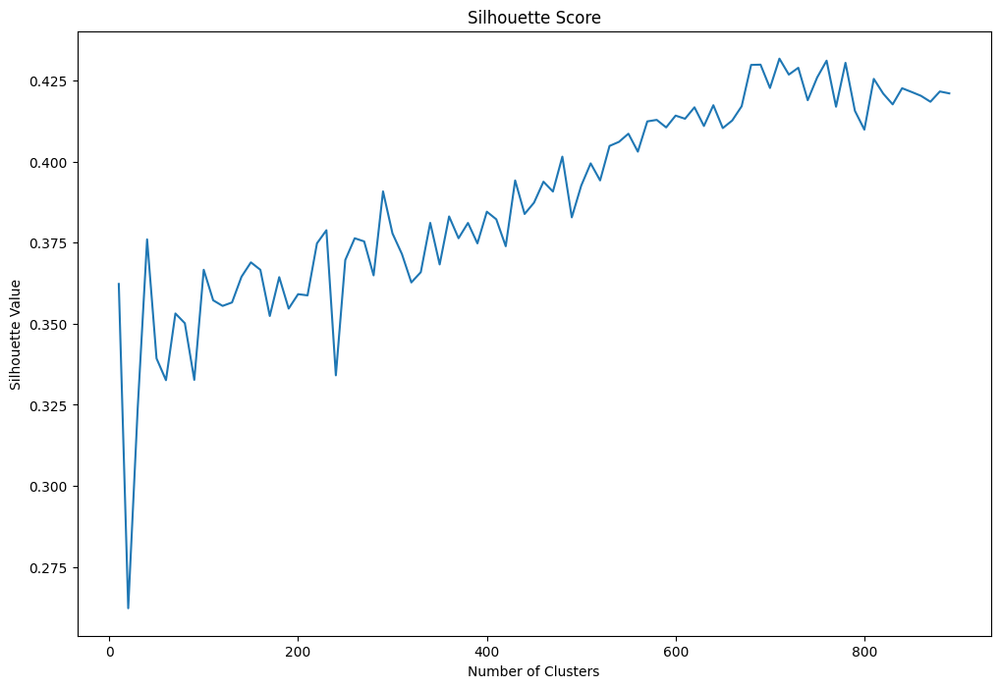

In [19]:
plt.figure(figsize=(12,8))
plt.plot(list(s_score.keys()),list(s_score.values()))
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Value')
plt.show()

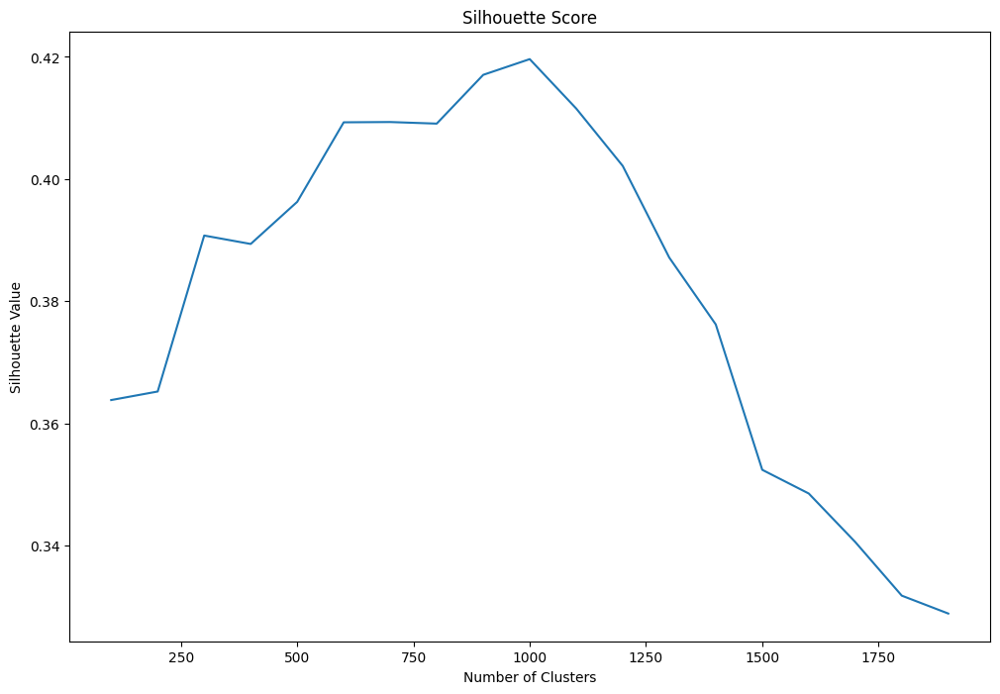

In [19]:
plt.figure(figsize=(12,8))
plt.plot(list(s_score.keys()),list(s_score.values()))
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Value')
plt.show()

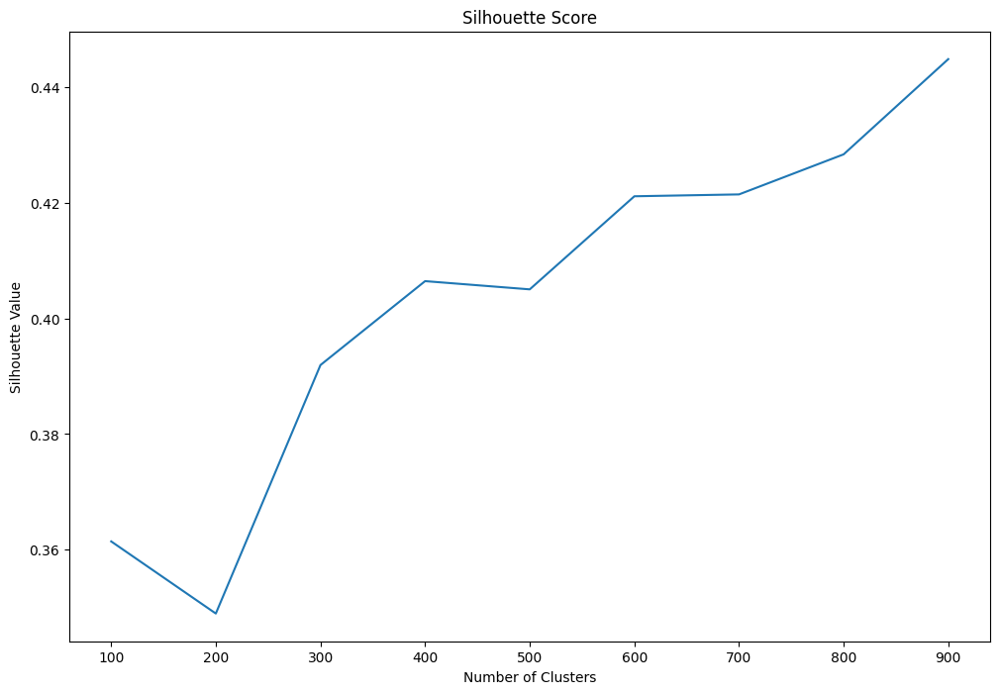

In [45]:
plt.figure(figsize=(12,8))
plt.plot(list(s_score.keys()),list(s_score.values()))
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Value')
plt.show()

### AIC and BIC

In [20]:
lowest_bic = np.infty
import itertools
bic = []
n_components_range = range(100, 2000,100)
cv_types = ['spherical', 'tied', 'diag', 'full']
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit Gaussian mixture theo phương pháp huấn luyện EM
        gmm = GaussianMixture(n_components=n_components,
                                      covariance_type=cv_type)
        gmm.fit(X)
        bic.append(gmm.bic(X))
        # Gán model có BIC scores thấp nhất là model tốt nhất
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

bic = np.array(bic)
color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue', 'darkorange'])
clf = best_gmm
bars = []


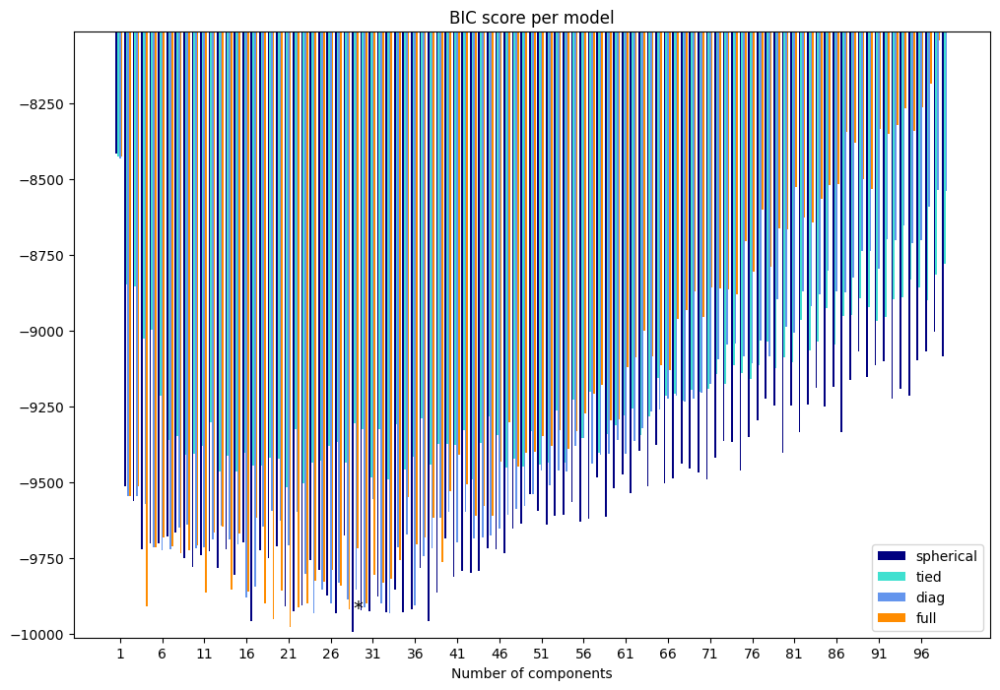

In [57]:
plt.figure(figsize=(12, 8))
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2 * (i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))

plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
plt.title('BIC score per model')
xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
    .2 * np.floor(bic.argmin() / len(n_components_range))
plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
plt.xlabel('Number of components')
plt.xticks(np.arange(1, 100, 5))
plt.legend([b[0] for b in bars], cv_types)

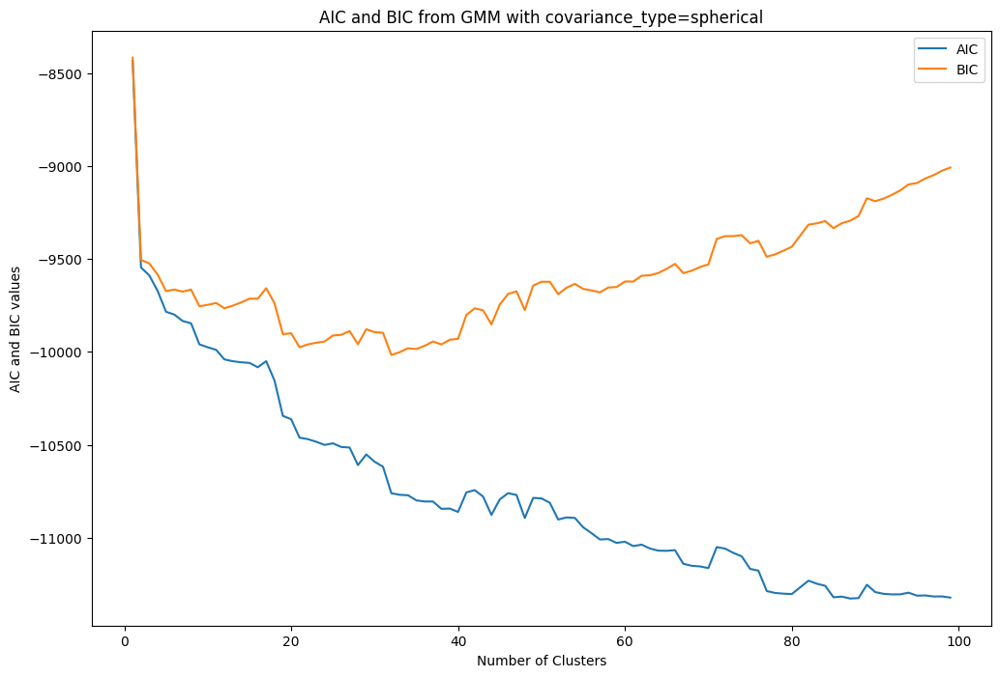

In [58]:
aic_score = {} 
bic_score = {}

# Loop through different number of clusters
for i in range(1,100): 
  # Create Gaussian Mixture Model
  gmm = GaussianMixture(n_components=i, random_state=0,covariance_type='spherical').fit(X)
  # Get AIC score for the model
  aic_score[i] = gmm.aic(X)
  # Get BIC score for the model
  bic_score[i] = gmm.bic(X)

# Visualization
plt.figure(figsize=(12,8))
plt.plot(list(aic_score.keys()),list(aic_score.values()), label='AIC')
plt.plot(list(bic_score.keys()),list(bic_score.values()), label='BIC')
plt.legend(loc='best')
plt.title('AIC and BIC from GMM with covariance_type=spherical')
plt.xlabel('Number of Clusters')
plt.ylabel('AIC and BIC values')
plt.show()

In [59]:
bic_sorted_spherical = sorted(bic_score.items(), key=lambda x: x[1])
bic_sorted_spherical = pd.DataFrame(bic_sorted_full)
bic_sorted_spherical.columns = ['Number of Clusters', 'BIC']
bic_sorted_spherical.head(10)

,Number of Clusters,BIC
0,26,-9947.716504
1,13,-9913.031678
2,4,-9906.471795
3,21,-9896.014365
4,30,-9895.547103
5,29,-9883.008197
6,14,-9879.792370
7,15,-9872.496547
8,22,-9860.893728
9,19,-9854.561179


Kết luận: số cluster tối ưu là 26 với convariance type là spherical

In [60]:
from sklearn.mixture import GaussianMixture
import folium
import pandas as pd
import numpy as np


clf.fit(X)
labels = clf.predict(X)
pick_up_spots['Cluster'] = labels

# Tạo bản đồ
m = folium.Map(location=[pick_up_spots['Latitude'].mean(), pick_up_spots['Longitude'].mean()], zoom_start=12)

# Tạo một bản đồ màu cho các cụm
unique_labels = np.unique(labels)
colors = {label: f'#{np.random.randint(0, 0xFFFFFF):06x}' for label in unique_labels}

# Tô màu các điểm dựa vào cụm
for index, row in pick_up_spots.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color=colors[row['Cluster']],
        fill=True,
        fill_color=colors[row['Cluster']]
    ).add_to(m)

m

C:\Users\luythoanduy\AppData\Local\Temp\ipykernel_22724\2807430572.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pick_up_spots['Cluster'] = labels


# Birch

In [62]:
from sklearn.cluster import Birch
s_score = {} 
for i in range(10,900,10):
  bir = Birch(n_clusters=i,threshold=0.000000001).fit(X)
  classes = bir.predict(X)
  s_score[i] = (silhouette_score(X, classes)) 
  print(f'The silhouette score for {i} clusters is {s_score[i]:.3f}') 

The silhouette score for 10 clusters is 0.313
The silhouette score for 20 clusters is 0.320
The silhouette score for 30 clusters is 0.349
The silhouette score for 40 clusters is 0.353
The silhouette score for 50 clusters is 0.357
The silhouette score for 60 clusters is 0.374
The silhouette score for 70 clusters is 0.374
The silhouette score for 80 clusters is 0.380
The silhouette score for 90 clusters is 0.384
The silhouette score for 100 clusters is 0.390
The silhouette score for 110 clusters is 0.396
The silhouette score for 120 clusters is 0.398
The silhouette score for 130 clusters is 0.399
The silhouette score for 140 clusters is 0.399
The silhouette score for 150 clusters is 0.394
The silhouette score for 160 clusters is 0.398
The silhouette score for 170 clusters is 0.399
The silhouette score for 180 clusters is 0.407
The silhouette score for 190 clusters is 0.412
The silhouette score for 200 clusters is 0.415
The silhouette score for 210 clusters is 0.417
The silhouette score f

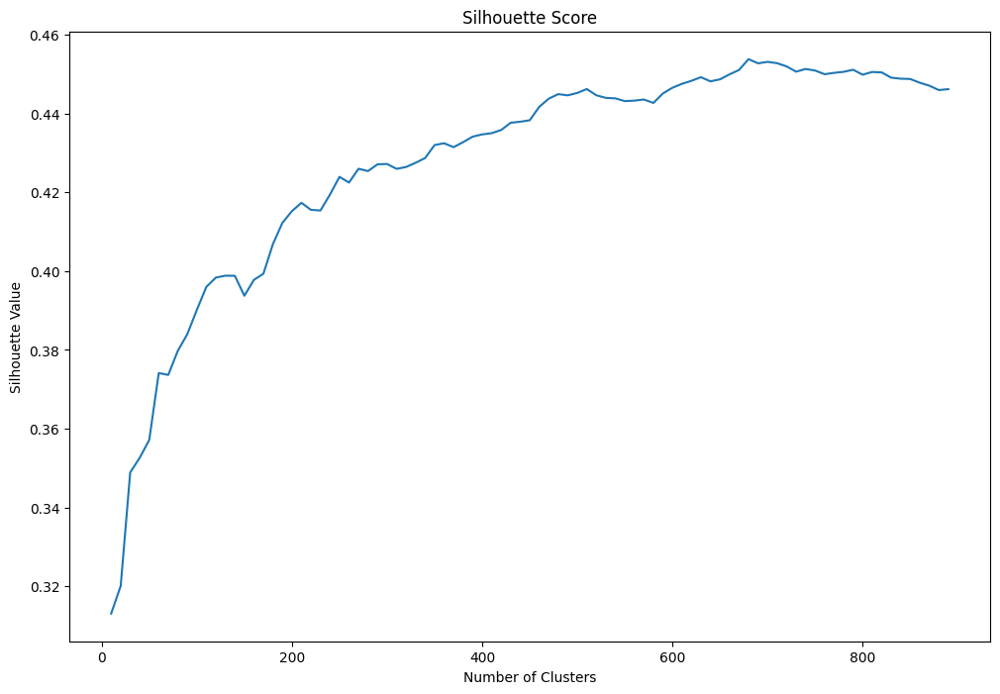

In [63]:
plt.figure(figsize=(12,8))
plt.plot(list(s_score.keys()),list(s_score.values()))
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Value')
plt.show()

In [120]:
def calculate_inertia(X, labels, cluster_centers, iloc=True):
    inertia = 0
    for i in range(len(X)):
        centroid = cluster_centers[i]
        if iloc:
            distance = np.linalg.norm(X.iloc[i] - centroid)
        else:
            distance = np.linalg.norm(X[i] - centroid)
        inertia += distance ** 2
    return inertia
def optimalB(data, nrefs=3, maxClusters=15):
    gaps = np.zeros((len(range(1, maxClusters)),))
    resultsdf = pd.DataFrame({'clusterCount':[], 'gap':[]})
    for gap_index, k in enumerate(range(1, maxClusters)):

        # Holder for reference dispersion results
        refDisps = np.zeros(nrefs)

        # For n references, generate random sample and perform kmeans getting resulting dispersion of each loop
        for i in range(nrefs):
            
            # Create new random reference set
            randomReference = np.random.random_sample(size=data.shape)
            
            # Fit to it
            bir = Birch(n_clusters=k,threshold=0.000000001)
            bir.fit(randomReference)
            
            refDisp = calculate_inertia(randomReference, bir.labels_, bir.subcluster_centers_,iloc=False)
            
            refDisps[i] = refDisp

        # Fit cluster to original data and create dispersion
        bir = Birch(n_clusters=k,threshold=0.000000001)
        bir.fit(data)

        origDisp = calculate_inertia(data, bir.labels_, bir.subcluster_centers_)

        # Calculate gap statistic
        gap = np.log(np.mean(refDisps)) - np.log(origDisp)
        
        # Assign this loop's gap statistic to gaps
        gaps[gap_index] = gap
        
        resultsdf = resultsdf.append({'clusterCount':k, 'gap':gap}, ignore_index=True)

    return (gaps.argmax() + 1, resultsdf)  

In [105]:
randomReference = np.random.random_sample(size=X.shape)
randomReference

array([[0.9887664 , 0.94828641],
       [0.85523295, 0.05075155],
       [0.98001143, 0.36960443],
       ...,
       [0.14005876, 0.45462381],
       [0.06851139, 0.96297623],
       [0.10144409, 0.51771222]])

In [106]:
X

,Latitude,Longitude
4965,31.163462,121.408132
11472,31.264673,121.421048
6580,31.268817,121.595555
8554,31.371058,121.417773
7560,31.234687,121.457015
...,...,...
6085,31.260780,121.342378
10804,31.245943,121.440435
9872,31.167702,121.565767
5826,31.267187,121.532055


In [130]:
k, gapdf = optimalB(X, nrefs=100, maxClusters=90)

C:\Users\luythoanduy\AppData\Local\Temp\ipykernel_22724\1920375244.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsdf = resultsdf.append({'clusterCount':k, 'gap':gap}, ignore_index=True)
C:\Users\luythoanduy\AppData\Local\Temp\ipykernel_22724\1920375244.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsdf = resultsdf.append({'clusterCount':k, 'gap':gap}, ignore_index=True)
C:\Users\luythoanduy\AppData\Local\Temp\ipykernel_22724\1920375244.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsdf = resultsdf.append({'clusterCount':k, 'gap':gap}, ignore_index=True)
C:\Users\luythoanduy\AppData\Local\Temp\ipykernel_22724\1920375244.py:45: FutureWarning: The frame.append method is deprecated and will 

KeyboardInterrupt: 

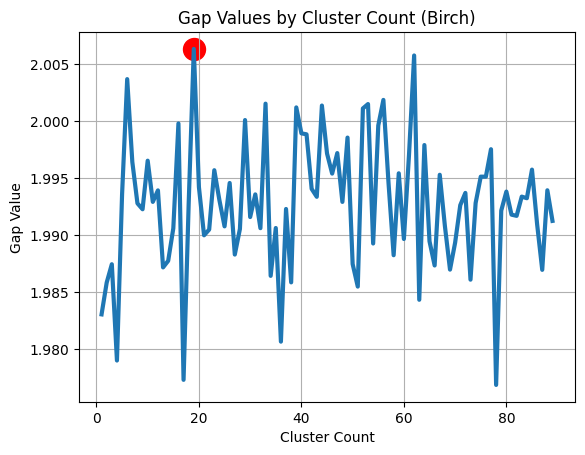

In [129]:
# Visualization
plt.plot(gapdf.clusterCount, gapdf.gap, linewidth=3)
plt.scatter(gapdf[gapdf.clusterCount == k].clusterCount, gapdf[gapdf.clusterCount == k].gap, s=250, c='r')
plt.grid(True)
plt.xlabel('Cluster Count')
plt.ylabel('Gap Value')
plt.title('Gap Values by Cluster Count (Birch)')
plt.show()

In [126]:
print('Optimal k is: ', k)

Optimal k is:  19


In [128]:
from sklearn.cluster import Birch
import folium
import pandas as pd
import numpy as np

# Giả sử X là ma trận dữ liệu của bạn với 'Latitude' và 'Longitude'.
# Ví dụ, X = pick_up_spots[['Latitude', 'Longitude']]

birch = Birch(threshold=0.00000001 ,n_clusters=19)  # Số cụm bạn muốn tạo. Đặt None để tự động xác định.
birch.fit(X)

# Sử dụng instance `birch` đã được fit để gọi phương thức `predict`.
labels = birch.predict(X)
pick_up_spots['Cluster'] = labels

# Tiếp tục với việc tạo bản đồ và vẽ các điểm dựa trên cụm...
m = folium.Map(location=[pick_up_spots['Latitude'].mean(), pick_up_spots['Longitude'].mean()], zoom_start=12)

# Tạo một bản đồ màu cho các cụm
unique_labels = np.unique(labels)
colors = {label: f'#{np.random.randint(0, 0xFFFFFF):06x}' for label in unique_labels}

# Tô màu các điểm dựa vào cụm
for index, row in pick_up_spots.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color=colors[row['Cluster']],
        fill=True,
        fill_color=colors[row['Cluster']]
    ).add_to(m)

m


C:\Users\luythoanduy\AppData\Local\Temp\ipykernel_22724\2594224801.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pick_up_spots['Cluster'] = labels


# affinity propagation

In [68]:
from sklearn.cluster import AffinityPropagation
import folium
import pandas as pd
import numpy as np

# Sử dụng Affinity Propagation để phân cụm
affinity_propagation = AffinityPropagation(random_state=5)
affinity_propagation.fit(X)
labels = affinity_propagation.predict(X)
pick_up_spots['Cluster'] = labels

# Tạo bản đồ
m = folium.Map(location=[pick_up_spots['Latitude'].mean(), pick_up_spots['Longitude'].mean()], zoom_start=12)

# Tạo một bản đồ màu cho các cụm
unique_labels = np.unique(labels)
colors = {label: f'#{np.random.randint(0, 0xFFFFFF):06x}' for label in unique_labels}

# Tô màu các điểm dựa vào cụm
for index, row in pick_up_spots.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color=colors[row['Cluster']],
        fill=True,
        fill_color=colors[row['Cluster']]
    ).add_to(m)

m


C:\Users\quang\AppData\Roaming\Python\Python312\site-packages\sklearn\cluster\_affinity_propagation.py:142: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
C:\Users\quang\AppData\Local\Temp\ipykernel_14848\4204919127.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pick_up_spots['Cluster'] = labels


# mean shift

In [69]:
from sklearn.cluster import MeanShift
import folium
import pandas as pd
import numpy as np

# Sử dụng Mean Shift để phân cụm
mean_shift = MeanShift()
mean_shift.fit(X)
labels = mean_shift.labels_
pick_up_spots['Cluster'] = labels

# Tạo bản đồ
m = folium.Map(location=[pick_up_spots['Latitude'].mean(), pick_up_spots['Longitude'].mean()], zoom_start=12)

# Tạo một bản đồ màu cho các cụm
unique_labels = np.unique(labels)
colors = {label: f'#{np.random.randint(0, 0xFFFFFF):06x}' for label in unique_labels}

# Tô màu các điểm dựa vào cụm
for index, row in pick_up_spots.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color=colors[row['Cluster']],
        fill=True,
        fill_color=colors[row['Cluster']]
    ).add_to(m)

m


C:\Users\quang\AppData\Local\Temp\ipykernel_14848\3961204409.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pick_up_spots['Cluster'] = labels


# Agglomerative Hierarchy

In [70]:
from sklearn.cluster import AgglomerativeClustering
import folium
import pandas as pd
import numpy as np

# Sử dụng Agglomerative Clustering để phân cụm
agglomerative = AgglomerativeClustering(n_clusters=3)
labels = agglomerative.fit_predict(X)
pick_up_spots['Cluster'] = labels

# Tạo bản đồ
m = folium.Map(location=[pick_up_spots['Latitude'].mean(), pick_up_spots['Longitude'].mean()], zoom_start=12)

# Tạo một bản đồ màu cho các cụm
unique_labels = np.unique(labels)
colors = {label: f'#{np.random.randint(0, 0xFFFFFF):06x}' for label in unique_labels}

# Tô màu các điểm dựa vào cụm
for index, row in pick_up_spots.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color=colors[row['Cluster']],
        fill=True,
        fill_color=colors[row['Cluster']]
    ).add_to(m)

m


C:\Users\quang\AppData\Local\Temp\ipykernel_14848\3894924736.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pick_up_spots['Cluster'] = labels


# Kmean

In [71]:
from sklearn.cluster import KMeans
import folium
import pandas as pd
import numpy as np

# Giả sử `X` là ma trận dữ liệu của bạn với 'Latitude' và 'Longitude'.
# X = pick_up_spots[['Latitude', 'Longitude']]

# Sử dụng K-Means để phân cụm
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(X)
labels = kmeans.labels_
pick_up_spots['Cluster'] = labels

# Tạo bản đồ
m = folium.Map(location=[pick_up_spots['Latitude'].mean(), pick_up_spots['Longitude'].mean()], zoom_start=12)

# Tạo một bản đồ màu cho các cụm
unique_labels = np.unique(labels)
colors = {label: f'#{np.random.randint(0, 0xFFFFFF):06x}' for label in unique_labels}

# Tô màu các điểm dựa vào cụm
for index, row in pick_up_spots.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color=colors[row['Cluster']],
        fill=True,
        fill_color=colors[row['Cluster']]
    ).add_to(m)

m


C:\Users\quang\AppData\Roaming\Python\Python312\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  ):
C:\Users\quang\AppData\Local\Temp\ipykernel_14848\1842972054.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pick_up_spots['Cluster'] = labels


# DBSCAN


In [78]:
from sklearn.cluster import DBSCAN
import folium
from sklearn.cluster import DBSCAN

X = pick_up_spots[['Latitude', 'Longitude']]


dbscan = DBSCAN(eps=0.01, min_samples=5)
dbscan.fit(X)
labels = dbscan.labels_
pick_up_spots['Cluster'] = labels

# Create a map centered around the pick up spot
m = folium.Map(location=[pick_up_spots['Latitude'].mean(), pick_up_spots['Longitude'].mean()], zoom_start=12)

# Color the pick up spots based on the cluster labels
for index, row in pick_up_spots.iterrows():
    folium.CircleMarker(location=[row['Latitude'], row['Longitude']], radius=5, color=colors[row['Cluster']], fill=True, fill_color=colors[row['Cluster']]).add_to(m)

# Display the map
m

C:\Users\quang\AppData\Local\Temp\ipykernel_14848\1812508893.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pick_up_spots['Cluster'] = labels


# OPTICS


In [77]:
from sklearn.cluster import OPTICS
import folium
import pandas as pd
import numpy as np

# Giả sử `X` là ma trận dữ liệu của bạn với 'Latitude' và 'Longitude'.
# X = pick_up_spots[['Latitude', 'Longitude']]

# Sử dụng OPTICS để phân cụm
optics = OPTICS(max_eps=0.02, min_samples=2, cluster_method='dbscan')
optics.fit(X)
labels = optics.labels_
pick_up_spots['Cluster'] = labels

# Tạo bản đồ
m = folium.Map(location=[pick_up_spots['Latitude'].mean(), pick_up_spots['Longitude'].mean()], zoom_start=12)

# Tạo một bản đồ màu cho các cụm, bao gồm cả ngoại lai (label = -1)
unique_labels = np.unique(labels)
colors = {label: f'#{np.random.randint(0, 0xFFFFFF):06x}' if label != -1 else '#000000' for label in unique_labels}

# Tô màu các điểm dựa vào cụm
for index, row in pick_up_spots.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color=colors[row['Cluster']],
        fill=True,
        fill_color=colors[row['Cluster']]
    ).add_to(m)

m


C:\Users\quang\AppData\Local\Temp\ipykernel_14848\4259480559.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pick_up_spots['Cluster'] = labels
